# COGS 108 - Effects of Regional Factors on Police Shootings.

# Overview

*In this project, we try to see if there is a relationship between regional factors such as crime rate, police department funding, racial diversity, gender, socioeconomic status and the number of police shootings in cities with a population over 500,000. We used multivariate regression analysis such as OLS. Eventually, we came to the conclusion that some of our factors were significant while others were not. The most important factor we found was racial diversity.*

# Names

- Natalie Kwong
- Pamela Nelson
- Lisa Kuwahara
- Prothit Halder
- Harsheta Cavale

<a id='research_question'></a>
# Research Question

*What regional factors (such as crime rate, police department funding, racial diversity, gender, socioeconomic status) are correlated with the number of police shootings in the largest U.S. cities (population ≥ 500,000)?*

<a id='background'></a>

## Background & Prior Work

Recent findings have shown unarmed victims of police shootings are more likely to be minorities. According to the FBI (2012) the general US population consisted of 13% Black, 17% Hispanic, and 63% White. However, if we took the population of people killed by policing while not attacking, that distribution consists of 39% Black, 12% Hispanic, and 46% White (Vox). This disparity clearly shows that there is a racial element regarding the unarmed police shootings.  According to the Washington Post, “the rate at which black Americans are killed by police is more than twice as high as the rate for white Americans.” 
Police funding in America’s largest cities range from 3.3% to over 28.6% of their total budget (USA Today.) Oftentimes these budgets are to the range of hundreds of millions of dollars to New York City’s 5 billion dollar budget. They generally account for the largest share of the budget for most of America’s largest cities. Our goal is to see if there is value in large police budgets in keeping the community safe. 
Our goal is to conduct a holistic analysis of different factors including city police budget, how race plays a role, and city crime rates affect the number of police shootings. Prior works have not taken all these factors into consideration, and therefore can allow for a more educated conversation regarding race, policing, and police budgets. This topic is becoming increasingly relevant in the past year after the murder of George Floyd, as there has been an increase in coversations related to solutions to policing in America. 

References (include links):
- 1) https://www.vox.com/2018/4/9/17205256/gun-violence-us-police-shootings 
- 2) https://www.vox.com/identities/2016/8/13/17938186/police-shootings-killings-racism-racial-disparities
- 3) https://www.vox.com/21292688/police-killings-data
- 4) https://law.yale.edu/sites/default/files/area/workshop/leo/leo16_fryer.pdf
- 5) https://www.nature.com/articles/d41586-020-01846-z
- 6) https://www.theguardian.com/us-news/2015/jun/01/black-americans-killed-by-police-analysis
- 7) https://www.vox.com/2014/8/21/6051043/how-many-people-killed-police-statistics-homicide-official-black
- 8) https://www.usatoday.com/story/money/2020/06/26/how-much-money-goes-to-police-departments-in-americas-largest-cities/112004904/
- 9) https://databricks.com/blog/2020/11/16/fatal-force-exploring-police-shootings-with-sql-analytics.html
- 10) https://citymonitor.ai/government/the-reality-of-us-city-budgets-police-funding-eclipses-most-other-agencies
- 11) https://www.washingtonpost.com/graphics/investigations/police-shootings-database/?itid=lk_inline_manual_5

# Hypothesis


*Based on media coverage on the recent police brutality and widespread protest on racial injustices in the US, it is reasonable to hypothesize that racial diversity does play a role in the number of police shootings. Furthermore, we also believe that there is a strong positive correlation between regional crime rates and the number of police shootings. The higher the levels of crime committed, the more aggressive the police force tends to be which could contribute to the higher number of police shootings.
In the case of police department funding, we postulate that there is a strong positive relationship with the number of police shootings. As the police department funding increases, the amount of shootings by the police force also increases. A larger budget allows for a larger police force which increases the chances of a shooting by a police officer occurings. More money also allows for more weapons in the hands of the police. Additionally, we expect that the police will shoot more men than women. *

*Lastly, based on various existing research, it is believed that there is a strong negative correlation between socioeconomic status and number of police shootings. It is more likely to be shot by a police officer in neighborhoods with higher poverty, which tend to be associated with higher levels of crime and thus patrolled and surveilled more by the police.*

# Dataset(s)


### We have four datasets. We will be combine these datasets based on the city.  

**Dataset Name**: Annual Estimates of the Resident Population for Incorporated Places of 50,000 or More, Ranked by July 1, 2019 Population: April 1, 2010 to July 1, 2019

**Link to the dataset**: https://www.census.gov/data/tables/time-series/demo/popest/2010s-total-cities-and-towns.html

**Number of observations**: 797 observations, 14 columns

This dataset, which is stored as an XLSX file and had to be converted to a CSV, contains resident population estimates for US cities with 50,000 or more residents. There is data for each year between 2010 and 2019. We are using this dataset to find the cities with populations of over 500,000. 

**Dataset Name**: data-police-shootings

**Link to the dataset**: https://github.com/washingtonpost/data-police-shootings/commit/7820f61d2e105672f4f687af8e5cbb84582aa950

**Number of observations**: 6268 observations, 17 variables

This dataset, which is stored as a CSV, contains information about the shooting such as name, date, manner of death, if they were armed, age, gender, race, city, state, and signs of mental illness. This dataset includes shootings from January 1st, 2015 to present day.

**Dataset Name**: US Cities Demographics

**Link to the dataset**: https://hub.arcgis.com/datasets/esri::usa-major-cities/explore

**Number of observations**: 3886 observations, 51 columns

This dataset, which is stored as a CSV file, contains demographic information (including race, population, age, and household) for major cities in the US. 

**Dataset Name**: Police Funding

**Link to the dataset**: Link to the dataset: https://github.com/masonyoungblood/police_budget_project/blob/master/primary_data.tsv

**Number of observations**:  473 observations, 13 columns

This dataset, which is stored as a TSV and had to be converted to a CSV, contains information about police spending for US cities

**Dataset Name**: US States and Cities GeoLocation.

**Link to the dataset**: Link to the dataset: https://simplemaps.com/data/us-cities

**Number of observations**:  28338 observations, 17 columns

This dataset, which is stored as a CSV contains information about the geographic location of each city and state, which we will use to create a bubble map of the number of shootings in each city.

# Setup

In [1]:
## YOUR CODE HERE
# The purpose of the command below is to illustrate plots with the notebook itself 
%matplotlib inline 
import numpy as np
import pandas as pd
# We will use the modules below for data visualization 
import matplotlib.pyplot as plt 
import seaborn as sns


#We would also like to filter out warnings throughout the report 
import warnings 
warnings.filterwarnings("ignore") 


#As for data analysis, we would use the modules below: 
import patsy
import statsmodels.api as sm 
import scipy.stats as stats 
from scipy.stats import ttest_ind, chisquare, normaltest

import sklearn
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix

#make the map of the united states to visualize each city's number of police shootings.
import geopandas as gpd

import plotly.express as px
import plotly.graph_objects as go

## Import Datasets

In [68]:
#Population of US Cities dataset
population = pd.read_csv("population.csv")

#Import Data Sets
# We get this data set from Washington Post (https://github.com/washingtonpost/data-police-shootings/commit/7820f61d2e105672f4f687af8e5cbb84582aa950)
policeshoot = pd.read_csv("fatal-police-shootings-data.csv")

# getting funding data into dataframe:
funding = pd.read_csv('primary_data.csv')

# demographics data set.
demographics = pd.read_csv("USA_Major_Cities.csv")

# the US cities data set that contains the lat/longitudes of each city.
us = pd.read_csv('uscities.csv')

# Data Cleaning

### We have one dataset, population, which we use to find the cities that have a population of over 500,000. We will use that information to filter the cities in our other datasets.  

### We also have 3 datasets, which we decided to clean them seperately. After, we will merge them using the cities column.

In [3]:
## YOUR CODE HERE
population = pd.read_csv('population.csv')
population.columns = ['city', 'population']
population.population = population.population.apply(lambda x : x.replace(',',''))
population['population'] = population['population'].astype(str).astype(int)
population = population[population['population'] >= 500000]
population.city = population.city.apply(lambda x : x.replace(' city',''))
#population.city = population.city.apply(lambda x : x.replace('New York','New York City'))
pop_list = list(population['city'])
pop = []
for city in pop_list:
    city = city.split(',', 1)[0]
    city = city.split(' (', 1)[0]
    city = city.split('-', 1)[0]
    city = city.split('/', 1)[0]
    pop.append(city)
pop

['New York',
 'Los Angeles',
 'Chicago',
 'Houston',
 'Phoenix',
 'Philadelphia',
 'San Antonio',
 'San Diego',
 'Dallas',
 'San Jose',
 'Austin',
 'Jacksonville',
 'Fort Worth',
 'Columbus',
 'Charlotte',
 'San Francisco',
 'Indianapolis',
 'Seattle',
 'Denver',
 'Washington',
 'Boston',
 'El Paso',
 'Nashville',
 'Detroit',
 'Oklahoma City',
 'Portland',
 'Las Vegas',
 'Memphis',
 'Louisville',
 'Baltimore',
 'Milwaukee',
 'Albuquerque',
 'Tucson',
 'Fresno',
 'Mesa',
 'Sacramento',
 'Atlanta']

#### First We clean the fatal police shootings data set

In [4]:
#delete irrelavent columns
df=policeshoot[['id', 'date', 'manner_of_death', 'armed', 'age', 'gender', 'race', 'city', 'state', 'signs_of_mental_illness', 'threat_level', 'flee', 'body_camera']]

#see how many shootings
city = policeshoot[['city']]

thecities = df[df.city.isin(pop)]

In [5]:
# Get an idea of which columns contain NAs
thecities.isna().any()

id                         False
date                       False
manner_of_death            False
armed                       True
age                         True
gender                      True
race                        True
city                       False
state                      False
signs_of_mental_illness    False
threat_level               False
flee                        True
body_camera                False
dtype: bool

In [6]:
#Get count of shootings before removing NAs
shooting_count = thecities.groupby(['city']).count()
shooting_count = shooting_count[['id']]
shooting_count.columns = ['num_shootings']

In [7]:
#We want no NA for age, gender, race, and armed.
thecities = thecities[thecities['race'].notna()]
thecities = thecities[thecities['age'].notna()]
thecities = thecities[thecities['gender'].notna()]
thecities = thecities[thecities['armed'].notna()]

In [8]:
#Replace M with 1, and F with 0 in the gender column.
thecities = thecities.replace({'gender':{'M':1,'F':0}})

In [9]:
#take a quick peak on gender of victims of police shootings in each city. 
#closer to 1, the more male.
thecities.groupby(['city'])['gender'].mean().sort_values(ascending=False)

city
Oklahoma City    1.000000
San Diego        1.000000
Indianapolis     1.000000
Philadelphia     1.000000
Milwaukee        1.000000
Portland         1.000000
Detroit          1.000000
Sacramento       1.000000
Nashville        1.000000
New York         1.000000
Boston           1.000000
Baltimore        1.000000
Jacksonville     0.972973
Houston          0.962963
San Antonio      0.959184
Louisville       0.958333
Tucson           0.958333
Las Vegas        0.958333
Mesa             0.954545
Los Angeles      0.953488
Atlanta          0.952381
Chicago          0.951220
Fresno           0.950000
Phoenix          0.945205
Memphis          0.941176
Charlotte        0.941176
Albuquerque      0.939394
San Jose         0.933333
Denver           0.931034
Fort Worth       0.928571
El Paso          0.928571
Dallas           0.923077
Seattle          0.923077
Columbus         0.921053
San Francisco    0.875000
Austin           0.870968
Washington       0.823529
Name: gender, dtype: float64

In [10]:
#Data for another dataset only contains data till January 1st 2021. So we will only keep the shootings from the beginning of this database (2015) till jan 2021.
thecities = thecities[thecities['date'] <= "2021-01-01"]

In [11]:
#cleaned final data frame we will be using
policeshootings = thecities

### This is our second dataset, which is the funding data.

In [12]:
funding = funding[funding.city.isin(['New York City', 'Los Angeles', 'Chicago', 'Houston', 'Phoenix','Philadelphia', 'San Antonio', 'San Diego', 'Dallas', 'San Jose', 'Austin', 'Jacksonville' , 'Fort Worth','Columbus', 'Charlotte', 'San Francisco', 'Indianapolis', 'Seattle','Denver', 'Washington', 'Boston', 'El Paso', 'Nashville', 'Detroit', 'Oklahoma City','Portland', 'Las Vegas', 'Memphis','Louisville' ,'Baltimore','Milwaukee', 'Albuquerque', 'Tucson', 'Fresno', 'Mesa','Sacramento', 'Atlanta'])]
funding = funding.drop(index = 133) #drops columbus GA
funding = funding.drop(index = 214) #Drops portland ME

In [13]:
# getting the columns we need
funding = funding[['city','police_budget', 'general_fund', 'income','inequality','non_white','violent_crime']]
funding = funding.replace("New York City", "New York")
funding.head()

,city,police_budget,general_fund,income,inequality,non_white,violent_crime
18,Phoenix,745289000,1425500000,29587,0.4737,27.666730,4.109543
22,Tucson,193274430,526500000,22829,0.4597,27.567617,4.827749
43,Fresno,201764000,485101400,22225,0.4851,41.772852,5.986382
47,Los Angeles,1733838124,10710077843,26697,0.5298,47.569449,5.615240
63,Sacramento,149763423,493480000,30488,0.4713,52.764686,4.983061


### We join police shootings with the funding based on the city column

In [14]:
# joining the police funding with main dataset on ‘city’
policeshootings = policeshootings.join(funding.set_index('city'), on='city', how='left')
policeshootings

,id,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,police_budget,general_fund,income,inequality,non_white,violent_crime
3,8,2015-01-04,shot,toy weapon,32.0,1,W,San Francisco,CA,True,attack,Not fleeing,False,6.957184e+08,6.091354e+09,49432.0,0.5128,53.273857,7.111346
12,22,2015-01-07,shot,knife,41.0,1,B,Columbus,OH,True,other,Not fleeing,False,3.599704e+08,9.650000e+08,29016.0,0.4432,40.512754,3.940745
20,325,2015-01-09,shot,gun,33.0,1,H,El Paso,TX,False,attack,Not fleeing,False,1.396010e+08,3.998555e+08,22545.0,0.4662,19.203826,3.640207
24,46,2015-01-13,shot,gun,34.0,1,W,Albuquerque,NM,False,attack,Foot,True,2.053480e+08,6.415560e+08,28447.0,0.4708,26.524226,10.545985
32,56,2015-01-15,shot,gun,27.0,1,B,Indianapolis,IN,False,attack,Foot,False,2.539370e+08,1.212270e+09,27588.0,0.4808,38.588237,12.474834
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5929,6456,2020-12-28,shot,gun,47.0,0,B,Phoenix,AZ,True,attack,Not fleeing,True,7.452890e+08,1.425500e+09,29587.0,0.4737,27.666730,4.109543
5934,6472,2020-12-28,shot,gun,47.0,1,B,Denver,CO,False,attack,Foot,False,2.542324e+08,1.489208e+09,37140.0,0.4958,23.526824,6.343413
5936,6519,2020-12-28,shot,unarmed,30.0,1,W,Phoenix,AZ,False,other,Foot,True,7.452890e+08,1.425500e+09,29587.0,0.4737,27.666730,4.109543
5937,6463,2020-12-29,shot,machete,18.0,1,H,New York,NY,False,attack,Not fleeing,False,5.596752e+09,9.246800e+10,31248.0,0.5499,57.328524,5.832237


### This is our third data set, which is about city demographics. We will clean it here.

In [15]:
#Cleaning demographics dataset
demographics = demographics[['NAME', 'POPULATION', 'WHITE', 'BLACK', 'AMERI_ES', 'ASIAN', 'HAWN_PI', 'HISPANIC','OTHER','MULT_RACE']]
demographics.columns = ['city', 'population', 'white_pop', 'black_pop', 'ameri_es_pop', 'asian_pop', 'hawn_pi_pop', 'hispanic_pop', 'other_pop', 'mult_race_pop']
#demographics = demographics[demographics.city.isin(['New York', 'Los Angeles', 'Chicago', 'Houston', 'Phoenix','Philadelphia', 'San Antonio', 'San Diego', 'Dallas', 'San Jose', 'Austin', 'Jacksonville' , 'Fort Worth','Columbus', 'Charlotte', 'San Francisco', 'Indianapolis', 'Seattle','Denver', 'Washington', 'Boston', 'El Paso', 'Nashville', 'Detroit', 'Oklahoma City','Portland', 'Las Vegas', 'Memphis','Louisville' ,'Baltimore','Milwaukee', 'Albuquerque', 'Tucson', 'Fresno', 'Mesa','Sacramento', 'Atlanta'])]
demographics = demographics[demographics['population'] >= 250000]
demographics = demographics[demographics.city.isin(pop)]
demographics['white'] = demographics['white_pop']/demographics['population']
demographics['black'] = demographics['black_pop']/demographics['population']
demographics['ameri_es'] = demographics['ameri_es_pop']/demographics['population']
demographics['asian'] = demographics['asian_pop']/demographics['population']
demographics['hawn_pi'] = demographics['hawn_pi_pop']/demographics['population']
demographics['hispanic'] = demographics['hispanic_pop']/demographics['population']
demographics['other'] = demographics['other_pop']/demographics['population']
demographics['mult_race'] = demographics['mult_race_pop']/demographics['population']

### We join policeshootings with demographics based on the city column. 

In [16]:
policeshootings = policeshootings.join(demographics.set_index('city'), on='city', how='left')


In [17]:
policeshootings.columns

Index(['id', 'date', 'manner_of_death', 'armed', 'age', 'gender', 'race',
       'city', 'state', 'signs_of_mental_illness', 'threat_level', 'flee',
       'body_camera', 'police_budget', 'general_fund', 'income', 'inequality',
       'non_white', 'violent_crime', 'population', 'white_pop', 'black_pop',
       'ameri_es_pop', 'asian_pop', 'hawn_pi_pop', 'hispanic_pop', 'other_pop',
       'mult_race_pop', 'white', 'black', 'ameri_es', 'asian', 'hawn_pi',
       'hispanic', 'other', 'mult_race'],
      dtype='object')

In [18]:
policeshootings['police_budget_per_capita'] = policeshootings['police_budget']/policeshootings['population']
policeshootings['general_fund_per_capita'] = policeshootings['general_fund']/policeshootings['population']
policeshootings

,id,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,...,white,black,ameri_es,asian,hawn_pi,hispanic,other,mult_race,police_budget_per_capita,general_fund_per_capita
3,8,2015-01-04,shot,toy weapon,32.0,1,W,San Francisco,CA,True,...,0.448184,0.056105,0.004620,0.307580,0.003856,0.139803,0.060871,0.043234,798.719712,6993.180347
12,22,2015-01-07,shot,knife,41.0,1,B,Columbus,OH,True,...,0.555138,0.252781,0.002416,0.036688,0.000588,0.050913,0.025763,0.029940,413.154570,1107.574779
20,325,2015-01-09,shot,gun,33.0,1,H,El Paso,TX,False,...,0.756430,0.031721,0.006857,0.011132,0.001310,0.754926,0.102942,0.025293,201.230192,576.378241
24,46,2015-01-13,shot,gun,34.0,1,W,Albuquerque,NM,False,...,0.670557,0.031599,0.044205,0.025462,0.001080,0.449423,0.144592,0.044332,361.836494,1130.463282
32,56,2015-01-15,shot,gun,27.0,1,B,Indianapolis,IN,False,...,0.586328,0.260613,0.003020,0.019933,0.000444,0.089454,0.051796,0.026674,293.666566,1401.934678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5929,6456,2020-12-28,shot,gun,47.0,0,B,Phoenix,AZ,True,...,0.594461,0.058455,0.020211,0.028474,0.001595,0.368355,0.166865,0.032681,465.403923,890.169173
5934,6472,2020-12-28,shot,gun,47.0,1,B,Denver,CO,False,...,0.591399,0.087824,0.011775,0.029210,0.000868,0.272994,0.101771,0.035108,363.437791,2128.896774
5936,6519,2020-12-28,shot,unarmed,30.0,1,W,Phoenix,AZ,False,...,0.594461,0.058455,0.020211,0.028474,0.001595,0.368355,0.166865,0.032681,465.403923,890.169173
5937,6463,2020-12-29,shot,machete,18.0,1,H,New York,NY,False,...,0.413887,0.240291,0.006617,0.119470,0.000592,0.268774,0.122225,0.037496,643.926624,10638.778894


In [19]:
city_shooting_freq = policeshootings.groupby(["city"])["manner_of_death"].count().reset_index(name="shooting_freq")
policeshootings = policeshootings.join(city_shooting_freq.set_index('city'), on='city', how='left')

In [20]:
def convert_race(string):
    if 'B' in string:
        output = 'black'
    elif 'H' in string:
        output = 'hispanic'
    elif 'W' in string:
        output = 'white'
    elif 'A' in string:
        output = 'asian'
    elif 'N' in string:
        output = 'native american'
    elif 'O' in string:
        output = 'other'
        
    else:
        output = string
    return output

In [21]:
policeshootings['race'] = policeshootings['race'].apply(convert_race)
policeshootings.head()

,id,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,...,black,ameri_es,asian,hawn_pi,hispanic,other,mult_race,police_budget_per_capita,general_fund_per_capita,shooting_freq
3,8,2015-01-04,shot,toy weapon,32.0,1,white,San Francisco,CA,True,...,0.056105,0.004620,0.307580,0.003856,0.139803,0.060871,0.043234,798.719712,6993.180347,16
12,22,2015-01-07,shot,knife,41.0,1,black,Columbus,OH,True,...,0.252781,0.002416,0.036688,0.000588,0.050913,0.025763,0.029940,413.154570,1107.574779,36
20,325,2015-01-09,shot,gun,33.0,1,hispanic,El Paso,TX,False,...,0.031721,0.006857,0.011132,0.001310,0.754926,0.102942,0.025293,201.230192,576.378241,14
24,46,2015-01-13,shot,gun,34.0,1,white,Albuquerque,NM,False,...,0.031599,0.044205,0.025462,0.001080,0.449423,0.144592,0.044332,361.836494,1130.463282,31
32,56,2015-01-15,shot,gun,27.0,1,black,Indianapolis,IN,False,...,0.260613,0.003020,0.019933,0.000444,0.089454,0.051796,0.026674,293.666566,1401.934678,18


In [22]:
city_gender_count_male = policeshootings.groupby(['city'])['gender'].sum()
city_gender_count_total = policeshootings.groupby(['city'])['gender'].count()
city_gender_count_female = city_gender_count_total - city_gender_count_male
city_gender_count = pd.DataFrame({'male_count':city_gender_count_male, 'female_count': city_gender_count_female})
city_gender_count.head()

,male_count,female_count
city,,
Albuquerque,29,2
Atlanta,20,1
Austin,25,4
Baltimore,20,0
Boston,7,0


In [23]:
cities_by_race = policeshootings.groupby([ 'city','race'])['race'].count().unstack('race').fillna(0)
cities_by_race = pd.merge(cities_by_race, shooting_count, on='city')
cities_by_race.head()

,asian,black,hispanic,native american,other,white,num_shootings
city,,,,,,,
Albuquerque,0.0,0.0,22.0,0.0,0.0,9.0,41
Atlanta,1.0,19.0,1.0,0.0,0.0,0.0,24
Austin,1.0,4.0,8.0,0.0,0.0,16.0,32
Baltimore,0.0,19.0,0.0,0.0,0.0,1.0,22
Boston,0.0,5.0,1.0,0.0,1.0,0.0,8


In [24]:
cities_by_race['prop_asian_shot'] = cities_by_race['asian']/cities_by_race['num_shootings']
cities_by_race['prop_black_shot'] = cities_by_race['black']/cities_by_race['num_shootings']
cities_by_race['prop_hispanic_shot'] = cities_by_race['hispanic']/cities_by_race['num_shootings']
cities_by_race['prop_white_shot'] = cities_by_race['white']/cities_by_race['num_shootings']
cities_by_race['prop_other_shot'] = cities_by_race['other']/cities_by_race['num_shootings']
cities_by_race['prop_native_american_shot'] = cities_by_race['native american']/cities_by_race['num_shootings']
cities_by_race = cities_by_race.drop(labels=['asian', 'black', 'hispanic', 'native american', 'other', 'white'], axis=1)
cities_by_race.head()

,num_shootings,prop_asian_shot,prop_black_shot,prop_hispanic_shot,prop_white_shot,prop_other_shot,prop_native_american_shot
city,,,,,,,
Albuquerque,41,0.000000,0.000000,0.536585,0.219512,0.000,0.0
Atlanta,24,0.041667,0.791667,0.041667,0.000000,0.000,0.0
Austin,32,0.031250,0.125000,0.250000,0.500000,0.000,0.0
Baltimore,22,0.000000,0.863636,0.000000,0.045455,0.000,0.0
Boston,8,0.000000,0.625000,0.125000,0.000000,0.125,0.0


In [25]:
shootings_by_city = policeshootings[['city', 'state', 'police_budget', 'general_fund', 'income', 'inequality', 'non_white', 'violent_crime', 'population', 'white_pop',
       'black_pop', 'ameri_es_pop', 'asian_pop', 'hawn_pi_pop', 'hispanic_pop',
       'other_pop', 'mult_race_pop', 'white', 'black', 'ameri_es', 'asian',
       'hawn_pi', 'hispanic', 'other', 'mult_race', 'police_budget_per_capita',
       'general_fund_per_capita']]
shootings_by_city = shootings_by_city.groupby([ 'city']).agg('mean')
shootings_by_city.head()

,police_budget,general_fund,income,inequality,non_white,violent_crime,population,white_pop,black_pop,ameri_es_pop,...,white,black,ameri_es,asian,hawn_pi,hispanic,other,mult_race,police_budget_per_capita,general_fund_per_capita
city,,,,,,,,,,,,,,,,,,,,,
Albuquerque,205348000.0,6.415560e+08,28447.0,0.4708,26.524226,10.545985,567516,380552,17933,25087,...,0.670557,0.031599,0.044205,0.025462,0.001080,0.449423,0.144592,0.044332,361.836494,1130.463282
Atlanta,204754624.0,6.776288e+08,31660.0,0.5790,59.733767,7.104744,464043,161115,226894,988,...,0.347198,0.488950,0.002129,0.028420,0.000284,0.047011,0.020078,0.018035,441.240626,1460.271511
Austin,434475745.0,1.100000e+09,36972.0,0.4851,26.511106,3.635924,935806,539760,64406,6901,...,0.576786,0.068824,0.007374,0.053285,0.000565,0.296757,0.109215,0.028559,464.279717,1175.457306
Baltimore,536376477.0,1.967250e+09,28210.0,0.5130,69.553929,18.618679,620488,183830,395781,2270,...,0.296267,0.637854,0.003658,0.023446,0.000442,0.041838,0.018216,0.020879,864.442950,3170.488390
Boston,414182026.0,1.409430e+09,32302.0,0.5437,47.417403,7.171228,661977,333033,150437,2399,...,0.503088,0.227254,0.003624,0.083439,0.000400,0.163022,0.078391,0.036757,625.674345,2129.122311


In [26]:
shootings_by_city = pd.merge(shootings_by_city, cities_by_race, on='city')
shootings_by_city= pd.merge(shootings_by_city, city_gender_count, on='city')

In [27]:
#Remove Mesa because there was no info on their police and funding
shootings_by_city = shootings_by_city[shootings_by_city['police_budget'].notna()]

In [28]:
shootings_by_city['shootings_per_capita'] = shootings_by_city['num_shootings']/shootings_by_city['population']
shootings_by_city.head()

,police_budget,general_fund,income,inequality,non_white,violent_crime,population,white_pop,black_pop,ameri_es_pop,...,num_shootings,prop_asian_shot,prop_black_shot,prop_hispanic_shot,prop_white_shot,prop_other_shot,prop_native_american_shot,male_count,female_count,shootings_per_capita
city,,,,,,,,,,,,,,,,,,,,,
Albuquerque,205348000.0,6.415560e+08,28447.0,0.4708,26.524226,10.545985,567516,380552,17933,25087,...,41,0.000000,0.000000,0.536585,0.219512,0.000,0.0,29,2,0.000072
Atlanta,204754624.0,6.776288e+08,31660.0,0.5790,59.733767,7.104744,464043,161115,226894,988,...,24,0.041667,0.791667,0.041667,0.000000,0.000,0.0,20,1,0.000052
Austin,434475745.0,1.100000e+09,36972.0,0.4851,26.511106,3.635924,935806,539760,64406,6901,...,32,0.031250,0.125000,0.250000,0.500000,0.000,0.0,25,4,0.000034
Baltimore,536376477.0,1.967250e+09,28210.0,0.5130,69.553929,18.618679,620488,183830,395781,2270,...,22,0.000000,0.863636,0.000000,0.045455,0.000,0.0,20,0,0.000035
Boston,414182026.0,1.409430e+09,32302.0,0.5437,47.417403,7.171228,661977,333033,150437,2399,...,8,0.000000,0.625000,0.125000,0.000000,0.125,0.0,7,0,0.000012


In [29]:
# Convert the dataframes to csv. 
# policeshootings.to_csv('final_police_shootings.csv') 
# shootings_by_city.to_csv('shootings_by_city')

# Data Analysis & Results

### EDA

In [30]:
## YOUR CODE HERE
## FEEL FREE TO ADD MULTIPLE CELLS PER SECTION
policeshootings = pd.read_csv("final_police_shootings.csv")
shootings_by_city = pd.read_csv('shootings_by_city.csv')


In [31]:
#Take a look at the columns of our dataframe. 
print(policeshootings.columns)

#Seeing the averages across the columns
policeshootings.describe() 

Index(['Unnamed: 0', 'id', 'date', 'manner_of_death', 'armed', 'age', 'gender',
       'race', 'city', 'state', 'signs_of_mental_illness', 'threat_level',
       'flee', 'body_camera', 'police_budget', 'general_fund', 'income',
       'inequality', 'non_white', 'violent_crime', 'population', 'white_pop',
       'black_pop', 'ameri_es_pop', 'asian_pop', 'hawn_pi_pop', 'hispanic_pop',
       'other_pop', 'mult_race_pop', 'white', 'black', 'ameri_es', 'asian',
       'hawn_pi', 'hispanic', 'other', 'mult_race', 'police_budget_per_capita',
       'general_fund_per_capita', 'shooting_freq'],
      dtype='object')


,Unnamed: 0,id,age,gender,police_budget,general_fund,income,inequality,non_white,violent_crime,...,black,ameri_es,asian,hawn_pi,hispanic,other,mult_race,police_budget_per_capita,general_fund_per_capita,shooting_freq
count,937.000000,937.000000,937.000000,937.000000,9.160000e+02,9.160000e+02,916.000000,916.000000,916.000000,916.000000,...,937.000000,937.000000,937.000000,937.000000,937.000000,937.000000,937.000000,916.000000,916.000000,937.000000
mean,2919.216649,3247.770544,33.991462,0.955176,7.256107e+08,4.980555e+09,29808.683406,0.493835,40.666911,6.641295,...,0.189882,0.010183,0.060376,0.001673,0.273589,0.109368,0.034667,439.330406,2055.931091,35.729989
std,1756.405709,1902.567450,11.712270,0.207028,9.546593e+08,1.497829e+10,5354.804327,0.031167,14.036030,2.960668,...,0.171305,0.009463,0.056823,0.002116,0.166117,0.060983,0.009572,133.122387,2408.027225,21.237180
min,3.000000,8.000000,13.000000,0.000000,1.396010e+08,3.998555e+08,18273.000000,0.443200,19.203826,2.812975,...,0.028997,0.002129,0.011132,0.000197,0.041838,0.018216,0.013355,201.230192,576.378241,7.000000
25%,1333.000000,1543.000000,25.000000,1.000000,2.141074e+08,7.402292e+08,26697.000000,0.471300,27.666730,4.827749,...,0.063280,0.004406,0.028420,0.000494,0.114085,0.057144,0.026977,358.471906,922.958405,18.000000
50%,2970.000000,3300.000000,32.000000,1.000000,4.494712e+08,1.338706e+09,29016.000000,0.479100,40.512754,5.913969,...,0.100900,0.006857,0.036688,0.001043,0.280054,0.116469,0.032681,413.154570,1151.573524,31.000000
75%,4424.000000,4906.000000,41.000000,1.000000,7.452890e+08,2.131891e+09,30506.000000,0.528900,50.457278,7.271724,...,0.260613,0.010704,0.060718,0.001595,0.394152,0.144592,0.044058,466.798906,2135.545587,48.000000
max,5938.000000,6662.000000,83.000000,1.000000,5.596752e+09,9.246800e+10,49432.000000,0.579000,85.448826,18.618679,...,0.899615,0.044205,0.307580,0.013463,0.754926,0.226507,0.067011,864.442950,14676.977218,81.000000


In [32]:
#take a quick peak on gender of victims of police shootings in each city. 
#closer to 1, the more male.
policeshootings.groupby(['city'])['gender'].mean().sort_values(ascending=False)

city
Philadelphia     1.000000
Nashville        1.000000
Indianapolis     1.000000
Milwaukee        1.000000
Portland         1.000000
Sacramento       1.000000
San Diego        1.000000
Detroit          1.000000
New York         1.000000
Oklahoma City    1.000000
Boston           1.000000
Baltimore        1.000000
Memphis          1.000000
Jacksonville     0.971429
Houston          0.960784
Las Vegas        0.958333
Louisville       0.958333
Tucson           0.956522
San Antonio      0.955556
Mesa             0.952381
Atlanta          0.952381
Los Angeles      0.950617
Chicago          0.947368
Fresno           0.947368
Columbus         0.944444
Phoenix          0.943662
Charlotte        0.941176
Albuquerque      0.935484
Denver           0.931034
El Paso          0.928571
San Jose         0.928571
Fort Worth       0.923077
Dallas           0.916667
Seattle          0.909091
San Francisco    0.875000
Washington       0.866667
Austin           0.862069
Name: gender, dtype: float64

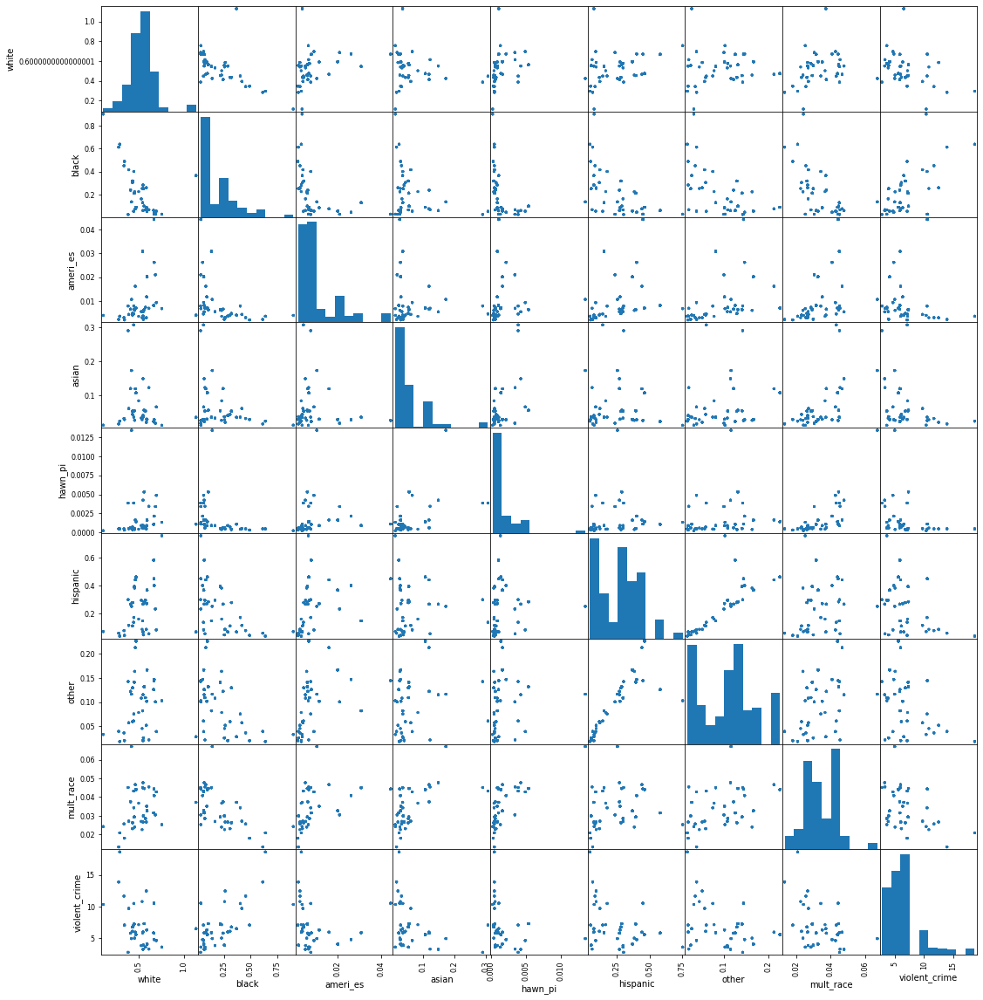

In [33]:
#generate scatter matrix to look at the relationship between multiple variables including various racial groups and crime rate

pd.plotting.scatter_matrix(policeshootings[["white","black","ameri_es","asian","hawn_pi","hispanic","other","mult_race","violent_crime"]], figsize=(18, 20)); 

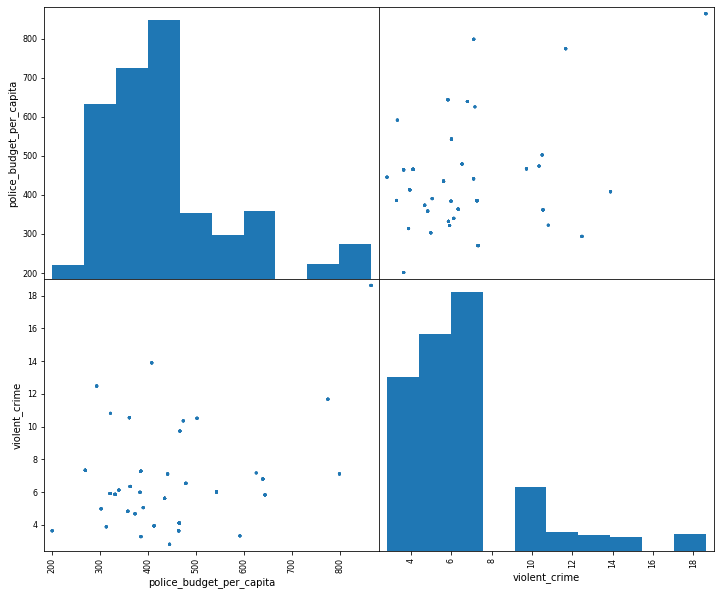

In [34]:
#Looking at scatter plot to see the relationship btwn police budget per capita and violent crime. 
pd.plotting.scatter_matrix(policeshootings[["police_budget_per_capita","violent_crime"]], figsize=(12,10)); 

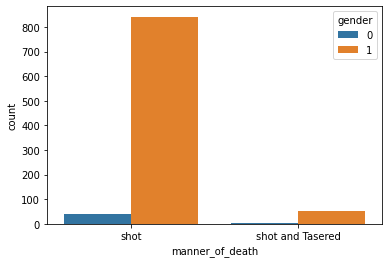

In [35]:
#A countplot seeing how different genders are shot/shot and tasered by the police.
ax = sns.countplot(x='manner_of_death', hue='gender',
                   data=policeshootings)

<AxesSubplot:xlabel='violent_crime', ylabel='count'>

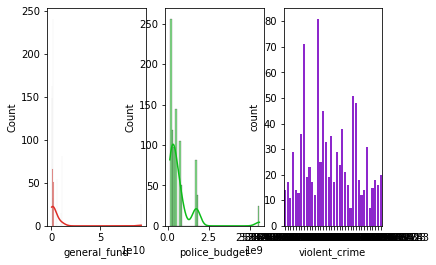

In [36]:
# Do these for each of the variable columns in our dataset 
plt.subplot(1, 3, 1)
sns.histplot(policeshootings['general_fund'], kde=True, color='#DE2D26')
plt.subplot(1, 3, 2)
sns.histplot(policeshootings['police_budget'], kde=True, color='#0CBD18')
plt.subplot(1, 3, 3) 
sns.countplot(policeshootings['violent_crime'], color='#940CE8')

<AxesSubplot:title={'center':'Shootings by City'}, ylabel='Number of Shootings'>

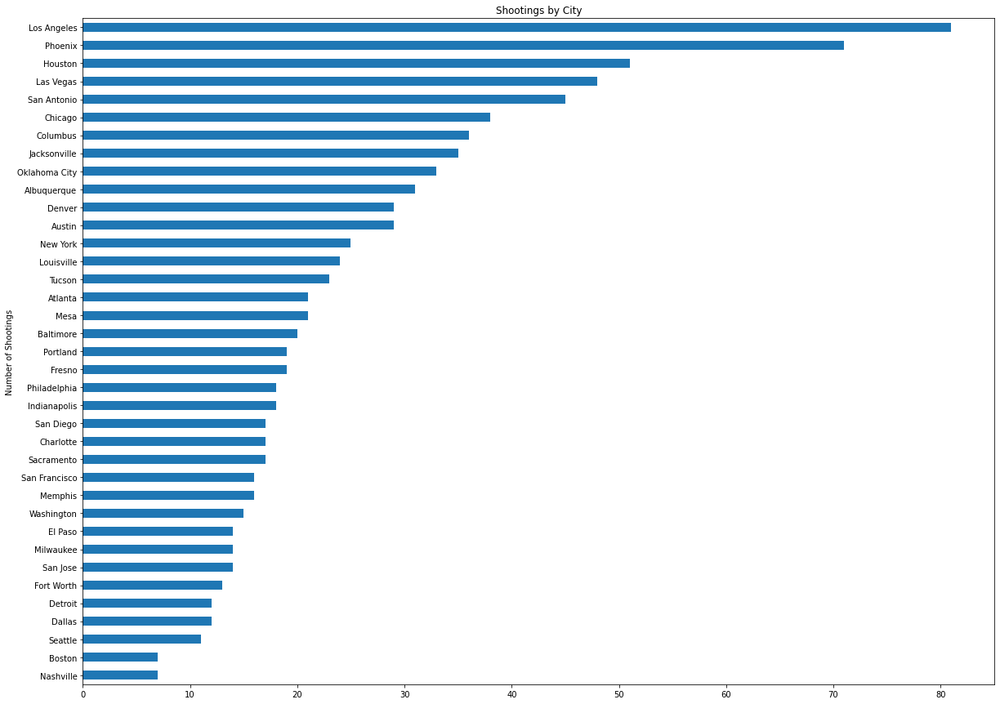

In [37]:
#visualize the count of shootings in each city.
bar = policeshootings['city'].value_counts().sort_values().plot.barh(figsize=(20,15), title="Shootings by City", ylabel="Number of Shootings", label="City")
#bar.set_yticklabels(bar.get_yticklabels(), rotation=40, ha="right")
bar


In [38]:
cities = policeshootings.groupby('city').agg('mean')
cities.head()

,Unnamed: 0,id,age,gender,signs_of_mental_illness,body_camera,police_budget,general_fund,income,inequality,...,black,ameri_es,asian,hawn_pi,hispanic,other,mult_race,police_budget_per_capita,general_fund_per_capita,shooting_freq
city,,,,,,,,,,,,,,,,,,,,,
Albuquerque,2886.354839,3202.806452,34.193548,0.935484,0.193548,0.193548,205348000.0,6.415560e+08,28447.0,0.4708,...,0.031599,0.044205,0.025462,0.001080,0.449423,0.144592,0.044332,361.836494,1130.463282,31.0
Atlanta,3378.428571,3724.809524,28.142857,0.952381,0.142857,0.142857,204754624.0,6.776288e+08,31660.0,0.5790,...,0.488950,0.002129,0.028420,0.000284,0.047011,0.020078,0.018035,441.240626,1460.271511,21.0
Austin,2229.827586,2487.000000,34.413793,0.862069,0.413793,0.137931,434475745.0,1.100000e+09,36972.0,0.4851,...,0.068824,0.007374,0.053285,0.000565,0.296757,0.109215,0.028559,464.279717,1175.457306,29.0
Baltimore,3160.650000,3483.400000,31.000000,1.000000,0.100000,0.450000,536376477.0,1.967250e+09,28210.0,0.5130,...,0.637854,0.003658,0.023446,0.000442,0.041838,0.018216,0.020879,864.442950,3170.488390,20.0
Boston,1970.000000,2187.571429,33.285714,1.000000,0.428571,0.142857,414182026.0,1.409430e+09,32302.0,0.5437,...,0.227254,0.003624,0.083439,0.000400,0.163022,0.078391,0.036757,625.674345,2129.122311,7.0


Text(0.5, 0, 'Gender')

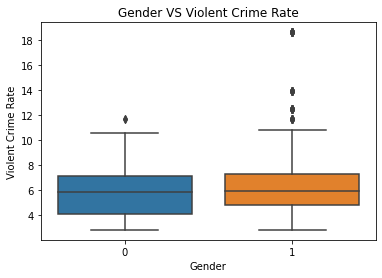

In [39]:
#Looking at the Gender vs Violent Crime Rate
sns.boxplot(x = 'gender', y = 'violent_crime', data = policeshootings)
ax = plt.gca()
ax.set_title('Gender VS Violent Crime Rate')
ax.set_ylabel('Violent Crime Rate')
ax.set_xlabel('Gender')

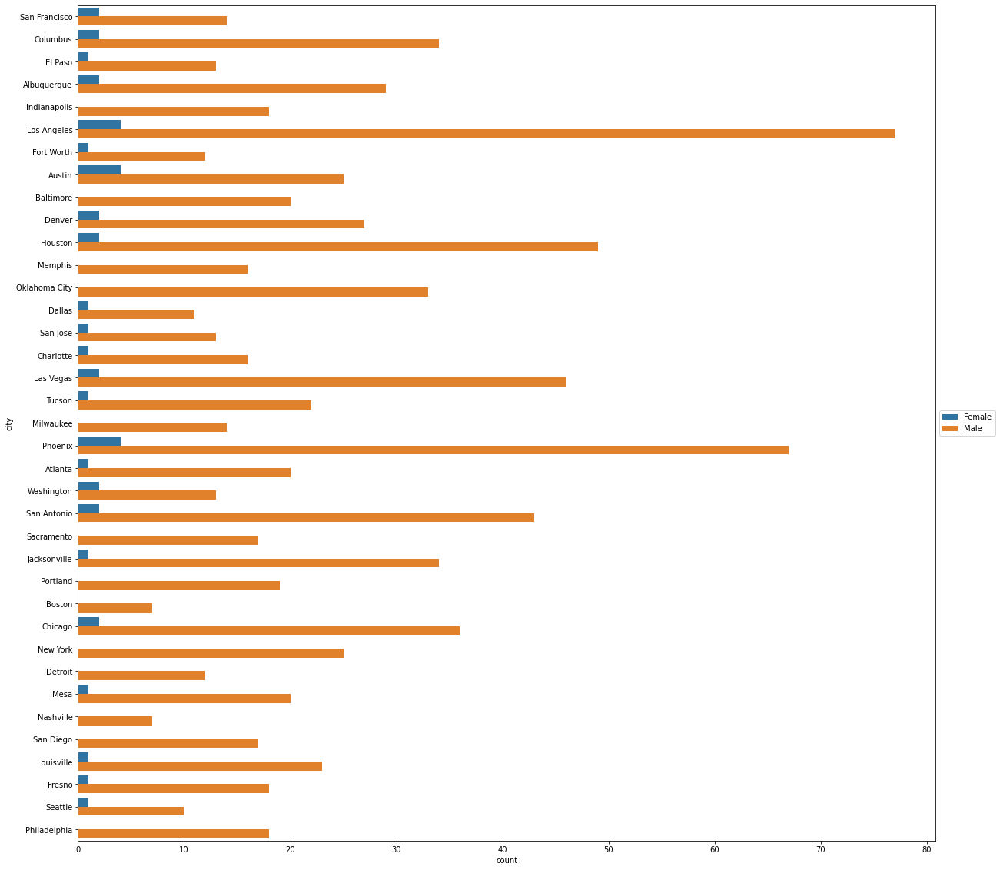

In [40]:
#Gender of shootings by city
plt.figure(figsize=(20,20))
ax = sns.countplot(y='city', hue='gender',
                   data=policeshootings, orient='h')
ax.legend(('Female','Male'), loc='center left', bbox_to_anchor=(1.0, 0.5));

#### Looking at the count plot above, we see how more males are shot at across each city than females. In some of the cities, there were 0 females shot like Baltimore. 

<AxesSubplot:ylabel='city'>

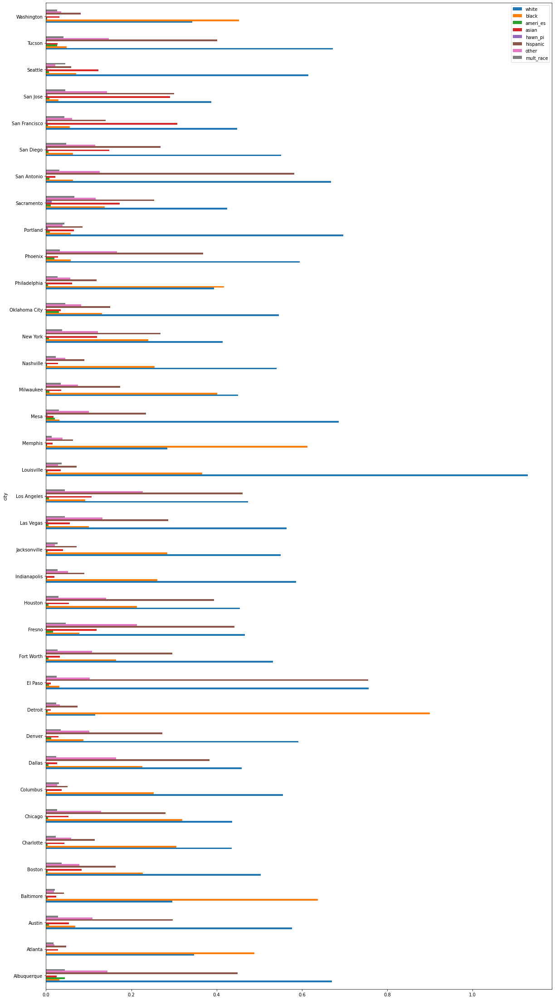

In [41]:
cities = policeshootings.groupby([ 'race','city'])['city'].count().unstack('city').fillna(0)
sub_df2 = np.transpose(cities.div(cities.sum()))

# We have a bar plot that shows the racial makeup of each city. 
citiesgroup = policeshootings.groupby('city').agg('mean')
citiesgroup.plot(figsize=(20,40), y=['white', 'black', 'ameri_es', 'asian', 'hawn_pi',
       'hispanic', 'other', 'mult_race'], kind="barh")

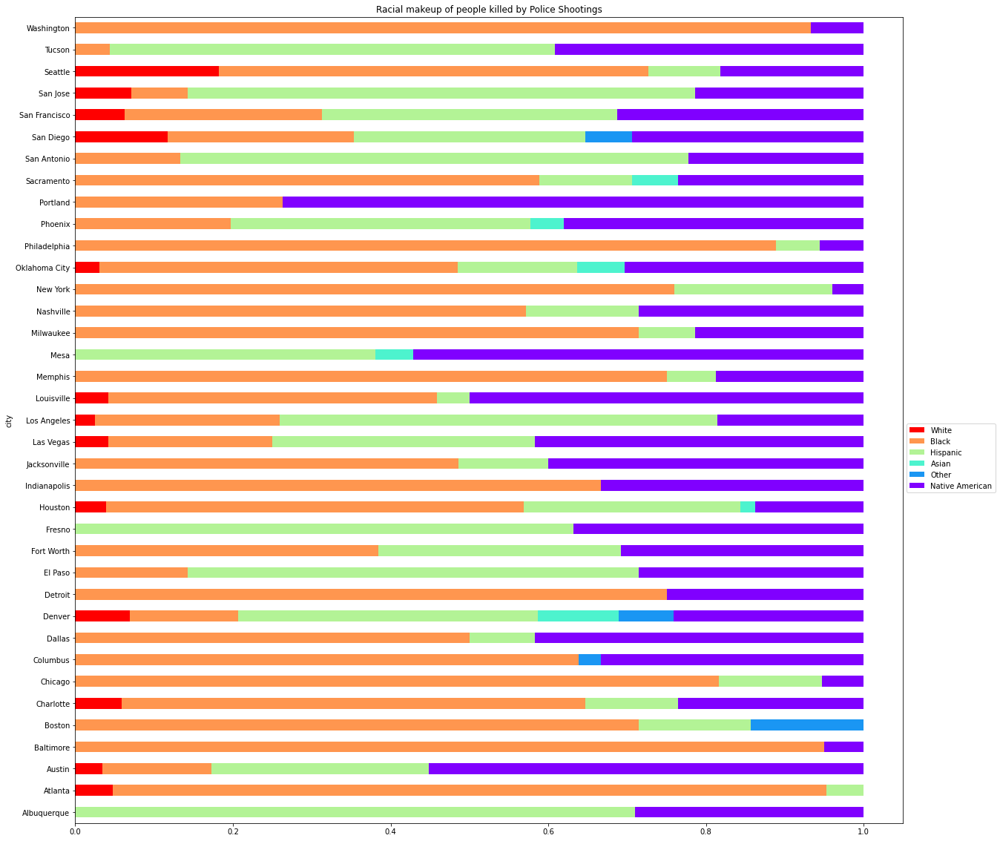

In [42]:
# generate plot
ax = sub_df2.plot(figsize=(20,20), kind='barh', stacked=True, rot=0, colormap='rainbow_r',
                  title='Racial makeup of people killed by Police Shootings')
# customize plot
ax.legend(('White','Black', 'Hispanic', 'Asian', 'Other', 'Native American'), bbox_to_anchor=(1.0, 0.5));

#### In this stacked bar plot, we observe a trend where a higher proportion of Black people being shot by the police. By contrast, we see white people are a lot less likely to be shot by the police compared to other racial groups. Native Americans are over represented in the graph, and therefore we think Native American and None population are combined. 

#### One case that struck our group's interest is how Portland is over 50% white, but the racial makeup of those shot by the Police in Portland is 0% white based on our data. We want to futher explore how someone's race affects the likelihood of being shot by the police.

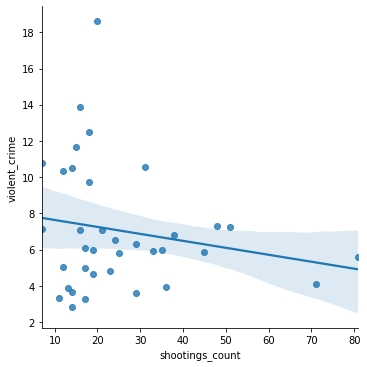

In [43]:
#Plotting violent crime with the number of shootings. Each point is a city. 
cities_count = policeshootings.groupby('city').agg('count')
cities_mean = policeshootings.groupby('city').agg('mean')
cities_count = cities_count[['id']]
cities_count.columns = ['shootings_count']
cities_crime = cities_mean[['violent_crime']]
cities_crime = pd.merge(cities_count, cities_crime, on='city')
sns.lmplot(x='shootings_count', y='violent_crime', fit_reg = True, data=cities_crime);

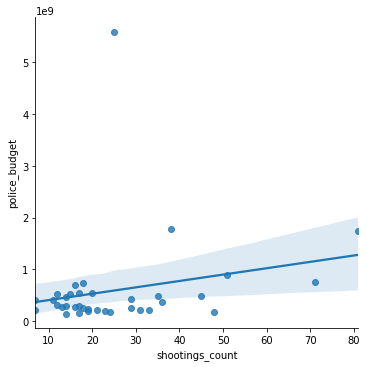

In [44]:
#Here we plot the police budget with the number of shootings. Each point is a city. 
cities_budget = cities_mean[['police_budget']]
cities_budget = pd.merge(cities_count, cities_budget, on='city')
sns.lmplot(x='shootings_count', y='police_budget', data=cities_budget);

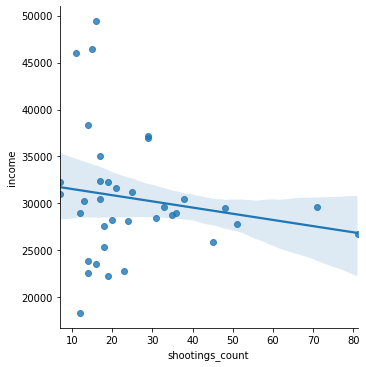

In [45]:
#Here we plot the mean city income with the number of shootings. Each point is a city. 
cities_income = cities_mean[['income']]
cities_income = pd.merge(cities_count, cities_income, on='city')
sns.lmplot(x='shootings_count', y='income', data=cities_income);


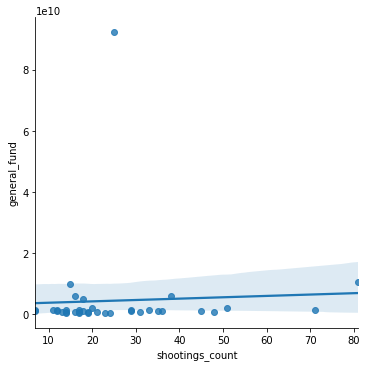

In [46]:
#Here we plot the city general fund with the number of shootings. Each point is a city. 
cities_fund = cities_mean[['general_fund']]
cities_fund = pd.merge(cities_count, cities_fund, on='city')
sns.lmplot(x='shootings_count', y='general_fund', data=cities_fund);

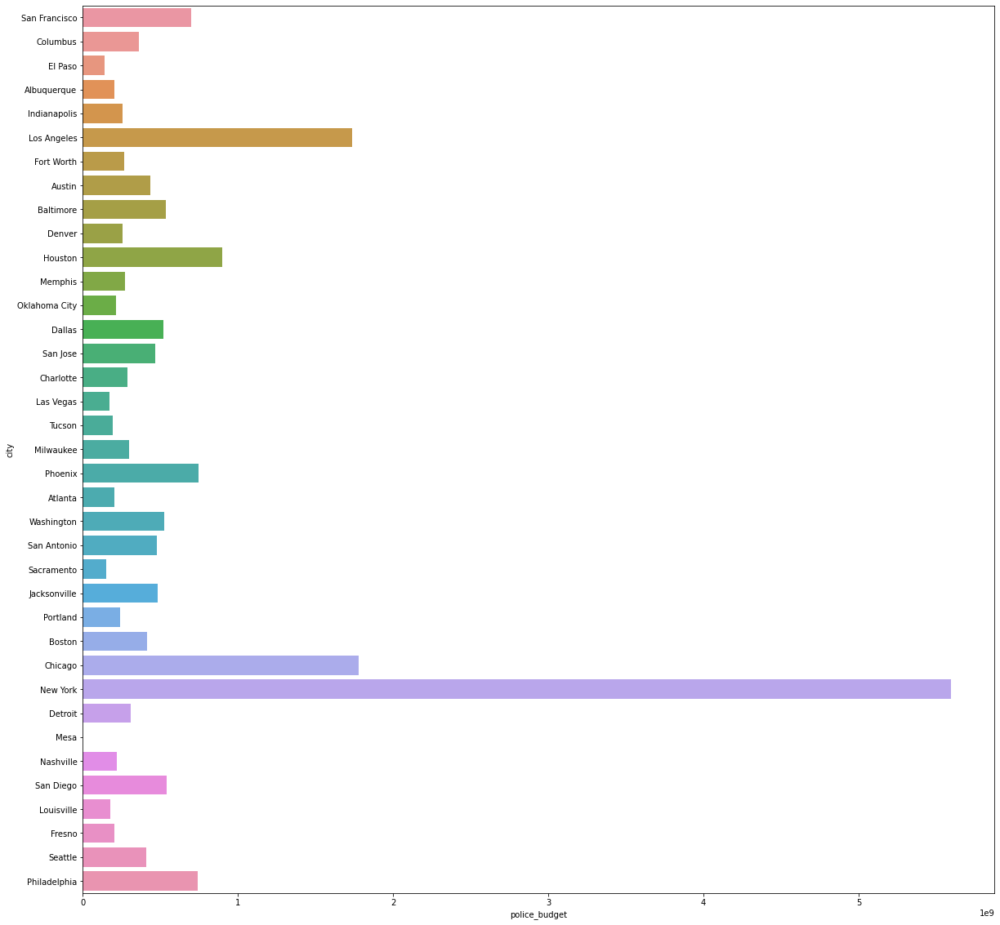

In [47]:
#Looking at the police budget across America's largest cities
plt.figure(figsize=(20,20))
sns.barplot(x='police_budget', y='city', data=policeshootings);

#### Here we see how there is a big range of police budgets across America's largest cities. We see how New York's police budget is more than double the next largest city. Mesa is also an outlier as it does not have a police budget. We will account the population of each city, by finding the budget per capita to get a more holistic view of city budgets.

In [48]:
#making a Bubble Map of the largest cities in the United States to see the number of shootings in each city.
df = pd.read_csv('shootings_by_city.csv')
us = pd.read_csv('uscities.csv')
state_id = ['NM','GA','TX','MD','MA','NC','IL','OH','TX','CO','MI','TX','TX','CA','TX','IN','FL','NV','CA',
           'KY','TN','AZ','WI','TN','NY','OK','PA','AZ','OR','CA','TX','CA','CA','CA','WA','AZ','DC']
df['state_id'] = state_id

us = us.drop(labels=['city_ascii','state_name', 'county_fips',
       'county_name', 'density', 'source',
       'military', 'incorporated', 'timezone', 'ranking', 'zips', 'id'],axis=1)

result = pd.merge(df, us, how="left")

In [49]:
result['city'] = result['city'].astype(str)

fig = go.Figure()
fig.add_trace(go.Scattergeo(
        locationmode = 'USA-states',
        lon = result['lng'],
        lat = result['lat'],
        text = result['city'] + ' Number of Shootings:' + result['number of shootings'].astype(str),
        marker = dict(
            size = result['number of shootings'],
            line_color='rgb(40,40,40)',
            line_width=0.5,
            sizemode = 'area',
            colorscale ='spectral',
            cmin = 0,
            color = result['number of shootings'],
            cmax = result['number of shootings'].max(),
            colorbar_title="Number of Shootings"
        ),
        name = 'Bubbles'))
fig.update_layout(
            title_text = 'Number of Shootings per City',
            showlegend = False,
            geo = dict(
            scope = 'usa',
            landcolor = 'rgb(217, 217, 217)'))
fig.show()

## Analysis and Results

### Regressions Methods 

#### Before starting our OLS regression analysis, we further cleaned up our policeshootings dataset to get the proportion of each racial group as well the number of males and females within each group. Initially, we had defined gender to be a binary outcome where 1= male and 0= female in our policeshootings dataset. However, we wanted to transform this categorical binary variable into a continuous independent variable in order to carry out regression analysis.

In [50]:
shootings_by_city = pd.read_csv("city_shootings.csv")

In [51]:
#renamed the column called number of shootings to num_shootings for the sake of abbreviation
shootings_by_city = shootings_by_city.rename(columns={"number of shootings": "num_shootings"})
print(shootings_by_city.columns)

Index(['Unnamed: 0', 'city', 'police_budget', 'general_fund', 'income',
       'inequality', 'non_white', 'violent_crime', 'population', 'white_pop',
       'black_pop', 'ameri_es_pop', 'asian_pop', 'hawn_pi_pop', 'hispanic_pop',
       'other_pop', 'mult_race_pop', 'white', 'black', 'ameri_es', 'asian',
       'hawn_pi', 'hispanic', 'other', 'mult_race', 'police_budget_per_capita',
       'general_fund_per_capita', 'num_shootings', 'prop_asian_shot',
       'prop_black_shot', 'prop_hispanic_shot', 'prop_white_shot',
       'prop_other_shot', 'prop_native_american_shot', 'male_count',
       'female_count'],
      dtype='object')


In [52]:
shootings_by_city.head()

,Unnamed: 0,city,police_budget,general_fund,income,inequality,non_white,violent_crime,population,white_pop,...,general_fund_per_capita,num_shootings,prop_asian_shot,prop_black_shot,prop_hispanic_shot,prop_white_shot,prop_other_shot,prop_native_american_shot,male_count,female_count
0,0,Albuquerque,205348000.0,6.415560e+08,28447.0,0.4708,26.524226,10.545985,567516,380552,...,1130.463282,31,0.000000,0.000000,0.709677,0.290323,0.000000,0.0,29,2
1,1,Atlanta,204754624.0,6.776288e+08,31660.0,0.5790,59.733767,7.104744,464043,161115,...,1460.271511,21,0.047619,0.904762,0.047619,0.000000,0.000000,0.0,20,1
2,2,Austin,434475745.0,1.100000e+09,36972.0,0.4851,26.511106,3.635924,935806,539760,...,1175.457306,29,0.034483,0.137931,0.275862,0.551724,0.000000,0.0,25,4
3,3,Baltimore,536376477.0,1.967250e+09,28210.0,0.5130,69.553929,18.618679,620488,183830,...,3170.488390,20,0.000000,0.950000,0.000000,0.050000,0.000000,0.0,20,0
4,4,Boston,414182026.0,1.409430e+09,32302.0,0.5437,47.417403,7.171228,661977,333033,...,2129.122311,7,0.000000,0.714286,0.142857,0.000000,0.142857,0.0,7,0


##### Hypothesis Testing : 

Here, we will evaluate the regional factors vs the number of police shootings 

Null hypothesis : the black population as well as the proportion of black population shot in each city has no effect on the number of police shootings.

Alternative hypothesis: the black population as well as the proportion of black population shot in each city has an effect on the number of police shootings. 


#### Bonferroni Correction
We chose to use the significance level of (alpha/m= 0.01) because 0.05/5 = 0.01 instead of alpha=0.05 to control for the family wise error rate at level 0.05.

m represents our number of regional factors while alpha represent the p-value.

In [53]:
outcome_1, predictors_1 = patsy.dmatrices('num_shootings ~ black_pop + prop_black_shot', shootings_by_city)
mod_1 = sm.OLS(outcome_1, predictors_1)
res_1 = mod_1.fit()

print(res_1.summary())

                            OLS Regression Results                            
Dep. Variable:          num_shootings   R-squared:                       0.140
Model:                            OLS   Adj. R-squared:                  0.087
Method:                 Least Squares   F-statistic:                     2.676
Date:                Wed, 09 Jun 2021   Prob (F-statistic):             0.0837
Time:                        13:46:43   Log-Likelihood:                -149.17
No. Observations:                  36   AIC:                             304.3
Df Residuals:                      33   BIC:                             309.1
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          33.5888      5.027     


The linear regression equation when examining the black population and the proportion of black people shot  is num_shootings = 33.5888+ (1.221e -05 black_pop) + (-24.5704 prop_black_shot ). The intercept signifies that if all the variables are held constant,then there would be approximately 34 shootings in the city. For every 1 unit increase in the black population , you would expect to see a 1.221e -05 increase in the number of shootings while holding other variables constant. Similarly, for every 1 unit increase in the proportion of black people shot, the number of shootings would decrease in the city while holding other variables constant.  Moreover, the pvalue is 0.156 > 0.01 ( significance level) . This suggest  that we fail to reject the null hypothesis that black population has no effect on the number of police shootings. In terms of the predictor (prop_black_shot), the pvalue is 0.029>0.01. Therefore, the proportion of black people shot has no effect on the number of police shootings and we can proceed to fail to  reject the aforementioned null hyphothesis. Furthermore, note that the adjusted R^2 value is very low ( 0.087) suggesting that a alot of what explains our outcome variable ( number of shootings) is not fully captured by the model itself. We looked at the adjusted R^2 value  instead of the R value as it adjust the correlation coefficient even after adjusting for the fact that we're adding a second predictor. 

The second warning produced by the multivariate regression indicates that some columns within our shooting_by_city dataframe are highly correlated. We recognize this perfect multicollinearity issue but this problem is too large for us to resolve in this report such as on illuminating on the variables that cause this problem. 

In [54]:
outcome_2, predictors_2 = patsy.dmatrices('num_shootings ~ white_pop + prop_white_shot', shootings_by_city)
mod_2 = sm.OLS(outcome_2, predictors_2)
res_2 = mod_2.fit()
print(res_2.summary())

                            OLS Regression Results                            
Dep. Variable:          num_shootings   R-squared:                       0.204
Model:                            OLS   Adj. R-squared:                  0.156
Method:                 Least Squares   F-statistic:                     4.223
Date:                Wed, 09 Jun 2021   Prob (F-statistic):             0.0233
Time:                        13:46:43   Log-Likelihood:                -147.77
No. Observations:                  36   AIC:                             301.5
Df Residuals:                      33   BIC:                             306.3
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          13.3116      6.098     


The linear regression equation when examining the white population and the proportion of white people shot  is num_shootings = 13.3116+ (1.227e -05 white_pop) + (18.5516 prop_white_shot ). The intercept signifies that if all the variables are held constant,then there would be approximately 14 shootings in the city. For every 1 unit increase in the white population , you would expect to see a 1.227e -05 increase in the number of shootings while holding other variables constant. Similarly, for every 1 unit increase in the proportion of white people shot, the number of shootings would decrease in the city while holding other variables constant.  

Moreover, the pvalue is 0.007 < 0.01 (significance level) . This suggest  that we  reject the null hypothesis that white population has no effect on the number of police shootings. In terms of the predictor (prop_white_shot), the pvalue is 0.274>0.01. Therefore, the proportion of white people shot has an effect on the number of police shootings and we can proceed in failing to reject the aforementioned null hyphothesis. Furthermore, note that the adjusted R^2 value is quite low ( 0.156) suggesting that a alot of what explains our outcome variable ( number of shootings) is not fully captured by the model itself. We looked at the adjusted R^2 value instead of the R value as it adjust the correlation coefficient even after adjusting for the fact that we're adding a second predictor. 

In [55]:
outcome_3, predictors_3 = patsy.dmatrices('num_shootings ~ prop_white_shot', shootings_by_city)
mod_3 = sm.OLS(outcome_3, predictors_3)
res_3 = mod_3.fit()

print(res_3.summary())

                            OLS Regression Results                            
Dep. Variable:          num_shootings   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                 -0.024
Method:                 Least Squares   F-statistic:                    0.1854
Date:                Wed, 09 Jun 2021   Prob (F-statistic):              0.669
Time:                        13:46:43   Log-Likelihood:                -151.78
No. Observations:                  36   AIC:                             307.6
Df Residuals:                      34   BIC:                             310.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          23.4195      5.479     

The linear regression equation when examining the proportion of white people shot is num_shootings = 23.4195+(7.6922 prop_white_shot ). The intercept signifies that if all the variables are held constant,then there would be approximately 24 shootings in the city. For every 1 unit increase in the proportion of white people shot, the number of shootings would increase in the city while holding other variables constant. Moreover, the pvalue is 0.669> 0.01. This suggest that we fail to reject the null hypothesis that the proportion of white population has no effect on the number of police shootings. Furthermore, note that the R^2 value is very low ( 0.005 )suggesting that a alot of what explains our outcome variable ( number of shootings) is not fully captured by the model itself. Only 0.5% of the overall variance is captured by our predictor ( the proportion of white people).

In [56]:
outcome_4, predictors_4 = patsy.dmatrices('num_shootings ~ prop_asian_shot + prop_black_shot + prop_hispanic_shot + prop_white_shot + prop_other_shot + prop_native_american_shot', shootings_by_city)
mod_4 = sm.OLS(outcome_4, predictors_4)
res_4 = mod_4.fit()
print(res_4.summary())

                            OLS Regression Results                            
Dep. Variable:          num_shootings   R-squared:                       0.202
Model:                            OLS   Adj. R-squared:                  0.069
Method:                 Least Squares   F-statistic:                     1.516
Date:                Wed, 09 Jun 2021   Prob (F-statistic):              0.215
Time:                        13:46:43   Log-Likelihood:                -147.82
No. Observations:                  36   AIC:                             307.6
Df Residuals:                      30   BIC:                             317.1
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

The linear regression equation when examining the proportion of all the races of people being shot is num_shootings = 24.1500+(-45.3736 prop_asian_shot)+(-3.7374 prop_black_shot)+(20.8367 prop_hispanic_shot)+(-4.8675 prop_white_shot)+ (-119.9988 prop_other_shot)+ ( 177.2906 prop_native_american_shot). The intercept signifies that if all the variables are held constant,then there would be approximately 25 shootings in the city. For every 1 unit increase in the proportion of asian people shot, the number of shootings would decrease in the city while holding other variables constant.  Moreover, the pvalue is 0.494 > 0.01. This suggest  that we fail to reject the null hypothesis that the proportion of asian population has no effect on the number of police shootings.  

For every 1 unit increase in the proportion of black people shot, the number of shootings would decrease in the city while holding other variables constant.  Moreover, the pvalue is 0.868 > 0.01 . This suggest  that we fail to reject the null hypothesis that the proportion of black population has no effect on the number of police shootings.  

For every 1 unit increase in the proportion of hispanic people shot, the number of shootings would increase in the city while holding other variables constant.  Moreover, the pvalue is 0.413 > 0.01. This suggest  that we fail to reject the null hypothesis that the proportion of hispanic population has no effect on the number of police shootings.  

For every 1 unit increase in the proportion of white people shot, the number of shootings would decrease in the city while holding other variables constant.  Moreover, the pvalue is  0.846 > 0.01. This suggest  that we fail to reject the null hypothesis that the proportion of white population has no effect on the number of police shootings.  

For every 1 unit increase in the proportion of people from other race group being shot, the number of shootings would decrease in the city while holding other variables constant.  Moreover, the pvalue is  0.217 > 0.01. This suggest  that we fail to reject the null hypothesis that the proportion of people from other race group  has no effect on the number of police shootings.  

For every 1 unit increase in the proportion of native americans being shot, the number of shootings would increase in the city while holding other variables constant.  Moreover, the pvalue is 0.125 > 0.01. This suggest  that we fail to reject the null hypothesis that the proportion of native americans  has no effect on the number of police shootings.  

Furthermore, note that the adjusted R^2 value is quite low ( 0.069) suggesting that a alot of what explains our outcome variable ( number of shootings) is not fully captured by the model itself. We looked at the adjusted R^2 value  instead of the R value as it adjust the correlation coefficient for the fact that we're adding multiple predictor. Just 6.9% of the overall variance in the number of shootings is explained by the racial diversity of the population within each city.

In [57]:
outcome_5, predictors_5 = patsy.dmatrices('num_shootings ~ police_budget_per_capita + general_fund_per_capita', shootings_by_city)
mod_5 = sm.OLS(outcome_5, predictors_5)
res_5 = mod_5.fit()
print(res_5.summary())

                            OLS Regression Results                            
Dep. Variable:          num_shootings   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                 -0.046
Method:                 Least Squares   F-statistic:                    0.2260
Date:                Wed, 09 Jun 2021   Prob (F-statistic):              0.799
Time:                        13:46:43   Log-Likelihood:                -151.63
No. Observations:                  36   AIC:                             309.3
Df Residuals:                      33   BIC:                             314.0
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept               

The linear regression equation when examining the police budget per capita and the general fund per capita is num_shootings =29.3191 + (-0.0066 police_budget_per_capita ) + ( -0.0004 general_fund_per_capita). The intercept signifies that if all the variables are held constant,then there would be approximately 24 shootings in the city. For every 1 unit increase in the police budget per capita , you would expect to see a decrease in the number of shootings while holding other variables constant. 

Similarly, for every 1 unit increase in the general fund per capita, the number of shootings would decrease in the city while holding other variables constant.  Moreover, the pvalue is   0.792 > 0.01 . This suggest  that we fail to reject the null hypothesis that police budget per capita has no effect on the number of police shootings. In terms of the predictor (general_fund_per_capita ), the pvalue is  0.765>0.01. Therefore, the general fund per capita has no effect on the number of police shootings and we can proceed in failing to reject the aforementioned null hyphothesis. 

Furthermore, note that the adjusted R^2 value is  extremely low ( -0.046 ) suggesting that a alot of what explains our outcome variable ( number of shootings) is not fully captured by the model itself. -4.6% of the overall variance in the number of shootings is explained by the  police budget and general fund per capita within each city.


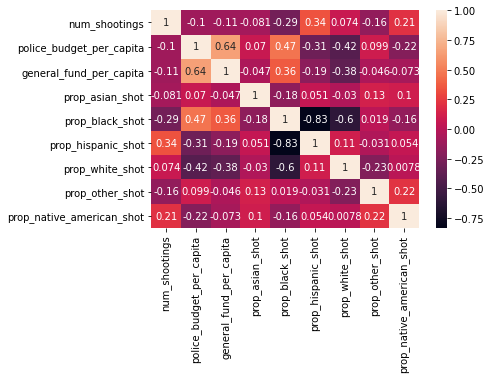

In [58]:
corr_matrix = shootings_by_city.loc[:,['num_shootings', 'police_budget_per_capita', 'general_fund_per_capita', 'prop_asian_shot','prop_black_shot', 'prop_hispanic_shot', 'prop_white_shot','prop_other_shot','prop_native_american_shot']].corr()

sns.heatmap(corr_matrix, annot=True);

From the above heatmap, we can observe that the proportion of hispanic people being shot and proportion of native american people being shot is moderately correlated with the number of police shootings within each city. Regional factors that are weakly correlated with the number of police shootings within each city is the police budget per capita, general fund per capita, proportion of asian people shot,proportion of black people shot and the proportion of people from other racial groups being shot.

#### We will also take a look at seeing the shootings per capita in each city.

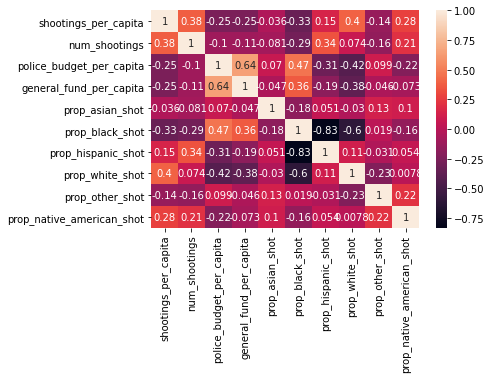

In [59]:
#Computing shootings per capita within each city 
shootings_by_city['shootings_per_capita'] = shootings_by_city['num_shootings']/shootings_by_city['population']

corr_matrix = shootings_by_city.loc[:,['shootings_per_capita', 'num_shootings', 'police_budget_per_capita', 'general_fund_per_capita', 'prop_asian_shot','prop_black_shot', 'prop_hispanic_shot', 'prop_white_shot','prop_other_shot','prop_native_american_shot']].corr()

sns.heatmap(corr_matrix, annot=True );

From the above heatmap, we can infer that the proportion of white people being shot and proportion of native american people being shot is moderately correlated with the shootings per capita within each city. Regional factors that are weakly correlated with the shootings per capita within each city is the police budget per capita, general fund per capita, proportion of asian people shot,proportion of black people shot, proportion of hispanic people being shot and the proportion of people from other racial groups being shot.

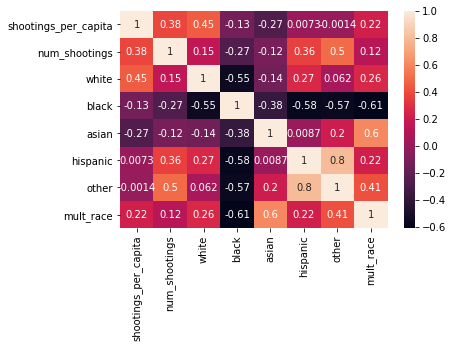

In [60]:
corr_matrix = shootings_by_city.loc[:,['shootings_per_capita', 'num_shootings', 
                                      'white', 'black', 'asian','hispanic',
                                       'other', 'mult_race']].corr()

sns.heatmap(corr_matrix, annot=True);

From the above heatmap, we can infer that the population of white people is moderately correlated with the shootings per capita whereas the population of hispanic people and population of people from other racial background is moderately correlated with the number of police shootings within each city. It's also interesting to note that the population of black and asian people are negatively correlated with the number of police shootings within each city.

#### Bonferroni Correction 

We chose to use the significance level of (alpha/m= 0.01) because 0.05/5 = 0.01 instead of alpha=0.05 to control for the family wise error rate at level 0.05. 
- m represents our number of regional factors while alpha represent the p-value. 


In [61]:
outcome_6, predictors_6 = patsy.dmatrices('shootings_per_capita ~ prop_asian_shot + prop_black_shot + prop_hispanic_shot + prop_white_shot + prop_other_shot + prop_native_american_shot', shootings_by_city)
mod_6 = sm.OLS(outcome_6, predictors_6)
res_6 = mod_6.fit()
print(res_6.summary())

                             OLS Regression Results                             
Dep. Variable:     shootings_per_capita   R-squared:                       0.253
Model:                              OLS   Adj. R-squared:                  0.129
Method:                   Least Squares   F-statistic:                     2.036
Date:                  Wed, 09 Jun 2021   Prob (F-statistic):              0.102
Time:                          13:46:47   Log-Likelihood:                 351.24
No. Observations:                    36   AIC:                            -690.5
Df Residuals:                        30   BIC:                            -681.0
Df Model:                             5                                         
Covariance Type:              nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
In

Our null hypothesis is that the proportion of each population racial background has no effect on the police shootings per capita within each city where the alternative hypothesis would be that the proportion of each population racial background has an effect on the police shootings per capita within each city .

The linear regression equation when examining the proportion of all the races of people being shot is shootings_per_capita = 3.891e-05+(-4.168e-05 prop_asian_shot)+(-2.263e-05prop_black_shot)+(-1.602e05 prop_hispanic_shot)+(1.414e-05 prop_white_shot)+ ( -8.945e-05 prop_other_shot)+ (0.0002 prop_native_american_shot). For every 1 unit increase in the proportion of asian people shot, the number of shootings would decrease in the city while holding other variables constant. Moreover, the pvalue is 0.510 > 0.01 . This suggest that we fail to reject the null hypothesis that the proportion of asian population has no effect on the police shootings per capita within each city.

For every 1 unit increase in the proportion of black people shot, the police shootings per capita within each city would decrease while holding other variables constant. Moreover, the pvalue is 0.296 < 0.01. This suggest that we reject the null hypothesis that the proportion of black population has no effect on the police shootings per capita within each city. There is a significant difference in the proportion of black population vs the police shootings per capita within each city.

For every 1 unit increase in the proportion of hispanic people shot, the police shootings per capita would decrease in the city while holding other variables constant. Moreover, the pvalue is 0.509 > 0.01 . This suggest that we fail to reject the null hypothesis that the proportion of hispanic population has no effect on the police shootings per capita within each city.

For every 1 unit increase in the proportion of white people shot, the police shootings per capita would increase in the city while holding other variables constant. Moreover, the pvalue is 0.554 > 0.01. This suggest that we fail to reject the null hypothesis that the proportion of white population has no effect on the police shootings per capita within each city.

For every 1 unit increase in the proportion of people from other race group being shot, the police shootings per capita would decrease in the city while holding other variables constant. Moreover, the pvalue is 0.332 > 0.01. This suggest that we fail to reject the null hypothesis that the proportion of people from other race group has no effect on the police shootings per capita within each city.

For every 1 unit increase in the proportion of native americans being shot, the police shootings per capita would increase in the city while holding other variables constant. Moreover, the pvalue is 0.079> 0.01 . This suggest that we fail to reject the null hypothesis that the proportion of native americans has no effect on the police shootings per capita within each city.

Furthermore, note that the adjusted R^2 value is low ( 0.129) suggesting that a alot of what explains our outcome variable ( police shootings per capita ) is not fully captured by the model itself. We looked at the adjusted R^2 value instead of the R value as it adjust the correlation coefficient for the fact that we're adding multiple predictor. 12.9% of the overall variance in the police shootings per capita is explained by the racial diversity of the population within each city.

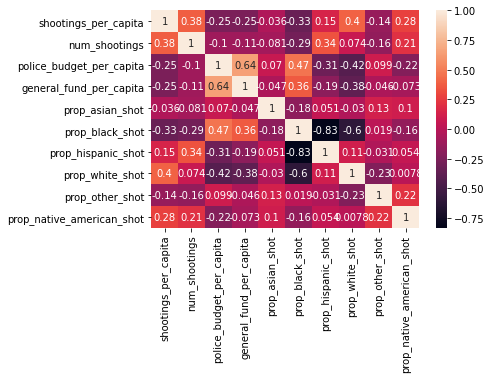

In [62]:
corr_matrix = shootings_by_city.loc[:,['shootings_per_capita', 'num_shootings', 'police_budget_per_capita', 'general_fund_per_capita', 'prop_asian_shot','prop_black_shot', 'prop_hispanic_shot', 'prop_white_shot','prop_other_shot','prop_native_american_shot']].corr()

sns.heatmap(corr_matrix, annot=True);

From the above heatmap, both the proportion of white people being shot and the proportion of native american people being shot is somewhat positively correlated with the shootings per capita within each US city.

In [63]:
outcome_7, predictors_7 = patsy.dmatrices('shootings_per_capita ~ black + prop_black_shot', shootings_by_city)
mod_7 = sm.OLS(outcome_7, predictors_7)
res_7 = mod_7.fit()
print(res_7.summary())

                             OLS Regression Results                             
Dep. Variable:     shootings_per_capita   R-squared:                       0.155
Model:                              OLS   Adj. R-squared:                  0.104
Method:                   Least Squares   F-statistic:                     3.033
Date:                  Wed, 09 Jun 2021   Prob (F-statistic):             0.0618
Time:                          13:46:49   Log-Likelihood:                 349.01
No. Observations:                    36   AIC:                            -692.0
Df Residuals:                        33   BIC:                            -687.3
Df Model:                             2                                         
Covariance Type:              nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept        3.751

The null hypothesis is that the black population and proportion of black being people being shot has no effect on the police shootings per capita within each city while the alternative hypothesis is that the black population and the proportion of black people being shot has an effect on the police shootings per capita within each city. 

The linear regression equation when examining the black population and the proportion of black people shot  is shootings_per_capita = 3.751e-05+ (2.831e -05 black_pop) + (-3.41 prop_black_shot ).
For every 1 unit increase in the black population , you would expect to see a 2.831e-05  increase in the police shooting per capita within each city while holding other variables constant. Similarly, for every 1 unit increase in the proportion of black people shot, the  police shooting per capita within each city  would decrease in the city while holding other variables constant.  Moreover, the pvalue is 0.190 > 0.01. This suggest  that we fail to reject the null hypothesis that black population has no effect on the police shooting per capita within each city. In terms of the predictor (prop_black_shot), the pvalue is 0.026 > 0.01. 

Therefore, the proportion of black people shot has an effect on the police shooting per capita within each city  and we can proceed to fail to reject the aforementioned null hyphothesis. Furthermore, note that the adjusted R^2 value is (0.104) suggesting that a alot of what explains our outcome variable ( police shooting per capita ) is not fully captured by the model itself. 
10.4% of the overall variance in the police shootings per capita is explained by the black population and proportion of black people shot. 


In [64]:
outcome_8, predictors_8 = patsy.dmatrices('shootings_per_capita ~ white + prop_white_shot', shootings_by_city)
mod_8 = sm.OLS(outcome_8, predictors_8)
res_8 = mod_8.fit()
print(res_8.summary())

                             OLS Regression Results                             
Dep. Variable:     shootings_per_capita   R-squared:                       0.232
Model:                              OLS   Adj. R-squared:                  0.186
Method:                   Least Squares   F-statistic:                     4.997
Date:                  Wed, 09 Jun 2021   Prob (F-statistic):             0.0127
Time:                          13:46:49   Log-Likelihood:                 350.74
No. Observations:                    36   AIC:                            -695.5
Df Residuals:                        33   BIC:                            -690.7
Df Model:                             2                                         
Covariance Type:              nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept        5.767


The null hypothesis is that the white population and proportion of white being people being shot has no effect on the police shootings per capita within each city while the alternative hypothesis is that the white population and the proportion of white people being shot has an effect on the police shootings per capita within each city. 

The linear regression equation when examining the white population and the proportion of white people shot  is shootings_per_capita = 5.767e-06 + ( 3.249e-05 white_pop) + (  2.188e-05 prop_white_shot ).
For every 1 unit increase in the white population , you would expect to see a  3.249e-05  increase in the police shooting per capita within each city while holding other variables constant. Similarly, for every 1 unit increase in the proportion of white people shot, the  police shooting per capita within each city  would increase in the city while holding other variables constant.  Moreover, the pvalue is 0.080  > 0.01 . This suggest  that we fail to reject the null hypothesis that the white population has no effect on the police shooting per capita within each city . In terms of the predictor (prop_white_shot), the pvalue is 0.255 > 0.01. Therefore, the proportion of white people shot has an effect on the police shooting per capita within each city  and we can fail to reject the aforementioned null hyphothesis. Furthermore, note that the adjusted R^2 value is (0.186) suggesting that a alot of what explains our outcome variable ( police shooting per capita ) is not fully captured by the model itself. 
18.6% of the overall variance in the police shootings per capita is explained by the white population and proportion of white people shot. 

In [65]:
outcome_9, predictors_9 = patsy.dmatrices('shootings_per_capita ~ income + inequality', shootings_by_city)
mod_9 = sm.OLS(outcome_9, predictors_9)
res_9 = mod_9.fit()
print(res_9.summary())

                             OLS Regression Results                             
Dep. Variable:     shootings_per_capita   R-squared:                       0.118
Model:                              OLS   Adj. R-squared:                  0.065
Method:                   Least Squares   F-statistic:                     2.215
Date:                  Wed, 09 Jun 2021   Prob (F-statistic):              0.125
Time:                          13:46:49   Log-Likelihood:                 348.24
No. Observations:                    36   AIC:                            -690.5
Df Residuals:                        33   BIC:                            -685.7
Df Model:                             2                                         
Covariance Type:              nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0001   4.25e-05

The null hypothesis is that the income and inequality variables has no effect on the police shootings per capita within each city while the alternative hypothesis is that the income and inequality variables has an effect on the police shootings per capita within each city.

The linear regression equation when examining the white population and the proportion of white people shot is shootings_per_capita = 0.0001 + ( -3.262e-10 income) + ( -0.0002 inequality). For every 1 unit increase in the income , you would expect to see a -3.262e-10 decrease in the police shooting per capita within each city while holding other variables constant. Similarly, for every 1 unit increase in the inequality variable, the police shooting per capita within each city would decrease in the city while holding other variables constant. Moreover, the pvalue is 0.425 > 0.01. This suggest that we fail to reject the null hypothesis the income has no effect on the police shootings per capita within each city. In terms of the predictor (inequality), the pvalue is 0.073 >0.01. Therefore, the level of inequality within the city has no effect on the police shooting per capita within each city and we can fail to reject the aforementioned null hyphothesis. Furthermore, note that the adjusted R^2 value is ( 0.065) suggesting that a alot of what explains our outcome variable ( police shooting per capita ) is not fully captured by the model itself. 6.5% of the overall variance in the police shootings per capita is explained by the income and inequality variables.

In [66]:
outcome_10, predictors_10 = patsy.dmatrices('shootings_per_capita ~ male_count + female_count', shootings_by_city)
mod_10 = sm.OLS(outcome_10, predictors_10)
res_10 = mod_10.fit()
print(res_10.summary())

                             OLS Regression Results                             
Dep. Variable:     shootings_per_capita   R-squared:                       0.145
Model:                              OLS   Adj. R-squared:                  0.093
Method:                   Least Squares   F-statistic:                     2.800
Date:                  Wed, 09 Jun 2021   Prob (F-statistic):             0.0753
Time:                          13:46:50   Log-Likelihood:                 348.80
No. Observations:                    36   AIC:                            -691.6
Df Residuals:                        33   BIC:                            -686.8
Df Model:                             2                                         
Covariance Type:              nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept     1.867e-05   4.

The null hypothesis is that the gender variable expressed through male and female count has no effect on the police shootings per capita within each city while the alternative hypothesis is that the gender variable expressed through male and female count has an effect on the police shootings per capita within each city.

The linear regression equation when examining the male and female count is shootings_per_capita = 1.867e-05 + ( 3.837e-07 income) + (2.277e-07 inequality). For every 1 unit increase in the male count , you would expect to see a 3.837e-07 increase in the police shooting per capita within each city while holding other variables constant. Similarly, for every 1 unit increase in the female_count, the police shooting per capita within each city would increase in the city while holding other variables constant. Moreover, the pvalue is 0.109 > 0.01. This suggest that we fail to reject the null hypothesis that male count has no effect on the police shootings per capita within each city. In terms of the female count , the pvalue is 0.943 > 0.01. Therefore, the number of females within the city has no effect on the police shooting per capita within each city and we can fail to reject the aforementioned null hyphothesis. Furthermore, note that the adjusted R^2 value is (0.093) suggesting that a alot of what explains our outcome variable ( police shooting per capita ) is not fully captured by the model itself. 9.3% of the overall variance in the police shootings per capita is explained by the number of males and females within each city.

In [67]:
outcome_11, predictors_11 = patsy.dmatrices('shootings_per_capita ~ violent_crime', shootings_by_city)
mod_11 = sm.OLS(outcome_11, predictors_11)
res_11 = mod_11.fit()
print(res_11.summary())

                             OLS Regression Results                             
Dep. Variable:     shootings_per_capita   R-squared:                       0.000
Model:                              OLS   Adj. R-squared:                 -0.029
Method:                   Least Squares   F-statistic:                 6.468e-05
Date:                  Wed, 09 Jun 2021   Prob (F-statistic):              0.994
Time:                          13:46:50   Log-Likelihood:                 345.98
No. Observations:                    36   AIC:                            -688.0
Df Residuals:                        34   BIC:                            -684.8
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept       2.83e-05  

The null hypothesis is that the violent crime rate has no effect on the police shootings per capita within each city while the alternative hypothesis is that the violent crime rate has an effect on the police shootings per capita within each city.

The linear regression equation when examining the male and female count is shootings_per_capita = 2.83e-05 +( 3.837e-07 violent_crime) . For every 1 unit increase in the violent_crime, you would expect to see a -6.592e-09 decrease in the police shooting per capita within each city while holding other variables constant. Moreover, the pvalue is 0.994 > 0.01. This suggest that we fail to reject the null hypothesis that violent crime rate has no effect on the police shootings per capita within each city. Furthermore, note that the R^2 value is (-0.029) suggesting that a alot of what explains our outcome variable ( police shooting per capita ) is not fully captured by the model itself. -2.9% of the overall variance in the police shootings per capita is explained by the violent crime rate occuring in the city.

# Ethics & Privacy

For our project, we considered ethics and privacy when collecting data, wrangling, and doing analysis. Because we are working with data on police shootings, we expected some information to be confidential, such as personal information of the people shot or their private family information. Therefore, we retrieved information from sources on Kaggle that has information publicly available. Since Kaggle has credible sources, privacy is guaranteed. Considering that this is a sensitive topic, where we work with city names, while conducting exploratory data analysis, we anonymized that part of our data by removing information on individual names of people shot by police. 

The implications of our project was that there is a possibility that the police departments across the US states could be seen differently because of our analysis. We made sure our analysis was objective so that our evaluations are purely based on data and what it shows. The stakeholders were individuals who got shot by police, as well as regions that are affected, considering the races, and socioeconomic status. One thing we had to consider was that we removed missing data during our data cleaning process, thus, we may be missing information that could have value. Thus, there will be some bias towards better data collected in our analysis. Furthermore, after removing most of our missing data, we noticed that out of the cities with larger populations, most columns for Mesa were missing, so we also removed that city before our analysis. 
In order to avoid possible bias in our analysis, we worked only with qualitative and quantitative data that are descriptive of police shootings, not subjective or opinionated data. For our evaluation, we took a look at regional factors, specifically grouped by the cities we saw had greater population. We decided to update our p-value using the Bonferroni Correction for a more fair evaluation because we had 5 as our number of tests. While we were doing analysis, we did not factor in bias, as we know more about bigger cities and have certain expectations, we treated the data without hoping for certain results, purely taking a look at our p-value given the significance level of 0.01 that we used. The topic on police shootings is a sensitive and personal topic, therefore, we realize that the missingness of information may have an effect on our results, and due to this, we decided training and testing data would not be the most efficient way of answering our research question. Furthermore, throughout our data analysis, we maintained healthy tracking of data, identifying assumptions in our model and making updates.

# Conclusion & Discussion

*Throughout this report, we aimed to explore the research question on “What regional factors (such as crime rate, police department funding, racial diversity, gender and socioeconomic status) are correlated with the number of police shootings in the largest U.S. cities with a population of over 500,000?”. In order to analyze data about this subject, we retrieved multiple datasets; one dataset consisted of having an entry for every fatal police shooting in the U.S. from 2015 to 2021, one dataset included population estimates of U.S. cities, another dataset had demographic information for U.S. cities including race and socioeconomic factors, and another dataset contained data on police spending in the U.S. To perform analysis on these data, we cleaned and merged these datasets to create a dataframe that consisted of an entry for every major city over 500,000 (excluding Mesa, which did not have information on police funding). Every entry consisted of the regional and demographic characteristics mentioned above (both raw and normalized), along with the number of shootings that occurred in each city and the proportion of people shot by race. We also created a dataframe that consisted of an entry for each person who was shot and attached regional city data to each entry. Next, to gain more familiarity with the dataframes, we performed EDA to explore characteristics of the cities and shootings. We created various scatterplots, regression line plots, and barplots that plotted factors such as gender of people shot, racial proportions of cities, race of people shot, and police budget against cities.*

*After having cleaned and prepared our shootings_by_city  data frame, we then complemented our hypothesis testing in which case the null would be that the regional factors had no effect on the number of police shootings and the alternative would be that the regional factors had an effect on the number of police shootings with our regression analysis. We investigated the correlation between our regional factors as the predictor variables and the number of police shootings as our outcome variable.  Before conducting the OLS, we used the Bonferroni correction method to determine our significance level. After performing the OLS on the independent variable gender and the dependent variable police shootings per capita , we found that gender was not statistically significant as it had no effect on police shootings per capita within each city.  We also found that socioeconomic status expressed through the variables income and inequality had no effect on the police shootings per capita within each city. Moreover, our results on the correlation between racial diversity and the police shootings per capita depicted that people of color were shot at a disproportionate rate in comparison to white people. We further illustrated this correlation of racial diversity through heat maps. The regional factors such as police budget per capita and the general budget per capita were also found to be statistically insignificant as they had no effect on the number of police shootings within each city.  Finally, the crime rate in each city was also found to be statistically insignificant as there was no effect on the police shooting per capita within each city seen in our linear regression model.*

### Limitations
We considered which limitations could have a possibility of affecting the results we discovered in our analysis. One of the main limitations through our study on the correlation between our regional factors and number of police shootings across each US city lies in our analysis . We did not incorporate polynomial regression methods to analyze our data to find the best fitting curve as  that is beyond the scope of this class. Besides this, we could have also extended our research question scope to look at the correlation between regional factors and the number of police shootings in cities with a population of over 500,000. Our report was only limited in scope to only explore large cities. 

We considered which limitations could have a possibility of affecting the results we discovered in our analysis. First, because it was difficult to retrieve demographic and police spending information on all locations in the U.S., we decided to limit our data to only large cities with populations of at least 500,000 people. Since urban areas tend to have a greater degree of diversity in their demographics and also tend to be more left-leaning in comparison to other types of locations in the U.S., this could affect our results and thus we cannot generalize our findings about large U.S. cities to the entire country.

Furthermore, as mentioned in the Ethics/Privacy section, we took out missing data which could have valuable information. Although we included all entries (even if those entries were missing some information) towards the number of shootings, we excluded these entries for all other graphs and analysis performed, including looking at racial proportions of those who were shot. Thus, these excluded entries could have possibly skewed our proportions.

Another limitation in our project is that we did not account for changes in racial demographic and police spending over time. The police shooting occurrences in our analysis were from 2015 to 2021, but we only used the most recent demographic and police spending information for our project. It would be interesting to perform analysis on changing demographics and police spending over time to see if there is any correlation between this and the number of shootings or the demographics of the people who have been shot. Similarly, we removed the dates of when the people were shot, which could also be another potential factor to look into. For example, we could see if there were any significant changes in the number of police shootings before and after shootings that made national news such as George Flloyd.



# Team Contributions

- Natalie Kwong: worked on data cleaning, EDA, limitations, discussion. 
- Pamela Nelson: worked on the analysis, conclusion, discussion, and EDA
- Lisa Kuwahara: worked on debugging for data cleaning, EDA, limitations, and privacy and ethics.
- Prothit Halder: worked on data cleaning, EDA, analysis, GitHub, and found datasets. 
- Harsheta Cavale: worked on the bubble map, EDA, data cleaning, found datasets.